In [1]:
import time
import datetime
start = time.time()

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import glob
import bbknn

Switching tutorials over to RNA Velocity (scVelo)

In [3]:
import scvelo as scv
scv.logging.print_version()
sc.logging.print_header()

Running scvelo 0.2.2 (python 3.7.8) on 2020-12-30 11:26.
scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


In [4]:
scv.settings.verbosity = 3  
scv.settings.set_figure_params('scvelo')

In [5]:
E24AmIs_subset_batchcorrected_analyzed = sc.read('./E24AmIs_subset_batchcorrected_analyzed.h5ad')

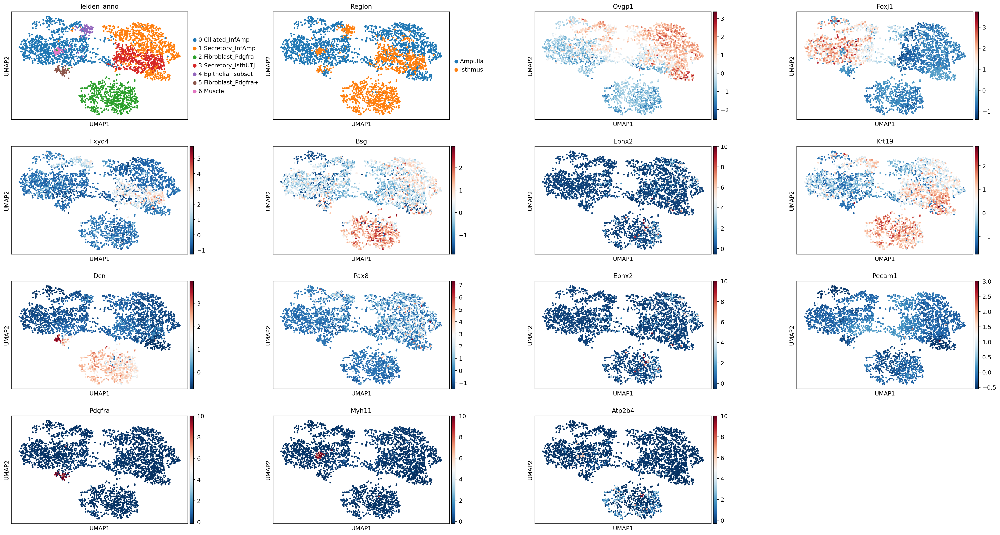

In [6]:
sc.pl.umap(E24AmIs_subset_batchcorrected_analyzed, wspace=0.35, color=['leiden_anno', 'Region', 'Ovgp1', 'Foxj1', 'Fxyd4', 'Bsg', 'Ephx2', 'Krt19', 'Dcn', 'Pax8', 'Ephx2', 'Pecam1', 'Pdgfra', 'Myh11', 'Atp2b4'])

In [7]:
E24AmIs_subset_batchcorrected_analyzed_velo = E24AmIs_subset_batchcorrected_analyzed.copy()

In [8]:
E24AmIs_subset_batchcorrected_analyzed

AnnData object with n_obs × n_vars = 2916 × 16932
    obs: 'Clusters', '_X', '_Y', 'Region', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Region_colors', "dendrogram_['leiden']", 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'leiden_anno_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

In [9]:
E24AmIs_subset_batchcorrected_analyzed_velo

AnnData object with n_obs × n_vars = 2916 × 16932
    obs: 'Clusters', '_X', '_Y', 'Region', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Region_colors', "dendrogram_['leiden']", 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'leiden_anno_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

Filtering and normalizing. Filtered genes that are detected less than 30 times in spliced and unspliced layers. n_top_genes is set to maximum to ensure we can plot later on in scatter plots. Compute moments for velocity estimations PCs and neighbors are 30 by default. 

In [10]:
scv.pp.filter_and_normalize(E24AmIs_subset_batchcorrected_analyzed_velo, min_shared_counts=30, n_top_genes=19116)
scv.pp.moments(E24AmIs_subset_batchcorrected_analyzed_velo, n_pcs=30, n_neighbors=30)

Filtered out 8845 genes that are detected 30 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


Compute velocities for all cells using the stochastic model which exploits not only the balance of of unspliced to spliced mRNA levels but also their covariation.

In [11]:
scv.tl.velocity(E24AmIs_subset_batchcorrected_analyzed_velo)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


Computes velocity graph by similarities between velocities and potential cell state transitions

In [12]:
scv.tl.velocity_graph(E24AmIs_subset_batchcorrected_analyzed_velo)

computing velocity graph
    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


Creates an FA plot instead of a UMAP, this a different map that is usually displays the cells slightly better for RNA velocity.

In [13]:
sc.tl.draw_graph(E24AmIs_subset_batchcorrected_analyzed_velo)

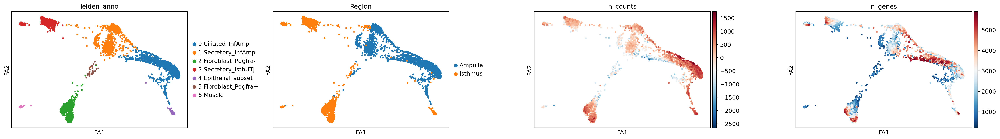

In [14]:
sc.pl.draw_graph(E24AmIs_subset_batchcorrected_analyzed_velo, wspace=0.35,
                 color=['leiden_anno', 'Region', 'n_counts', 'n_genes'])

Plot velocity vectors on UMAP compared to FA plot FA plots are better for these vectors

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


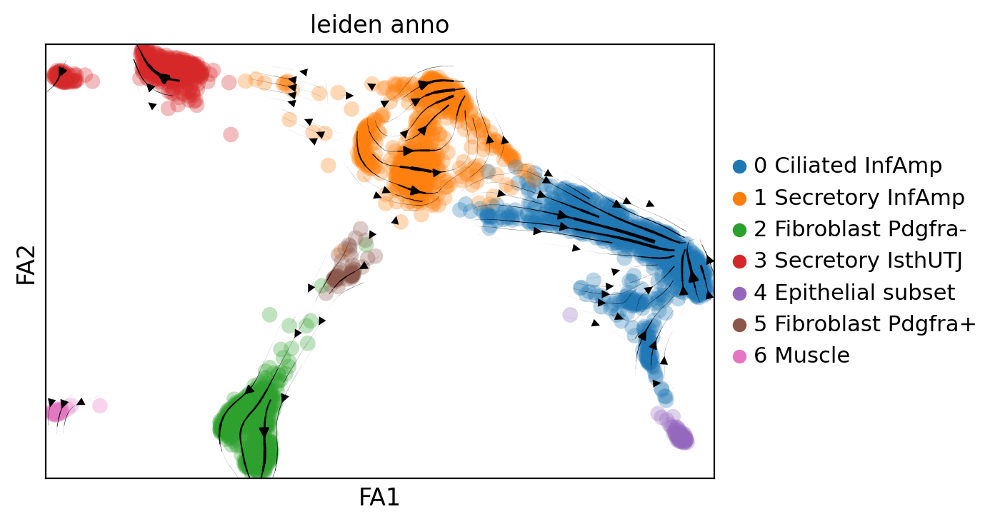

In [15]:
scv.pl.velocity_embedding_stream(E24AmIs_subset_batchcorrected_analyzed_velo, basis='X_draw_graph_fa',
                                 color=['leiden_anno'],
                                 frameon=True, legend_loc='right margin')

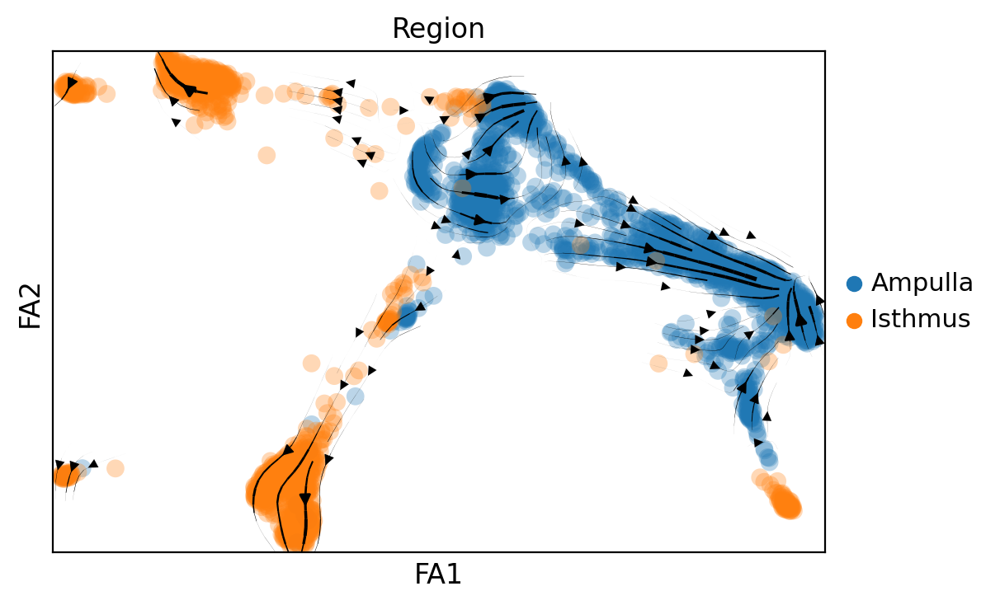

In [16]:
scv.pl.velocity_embedding_stream(E24AmIs_subset_batchcorrected_analyzed_velo, basis='X_draw_graph_fa',
                                 color=['Region'],
                                 frameon=True, legend_loc='right margin')

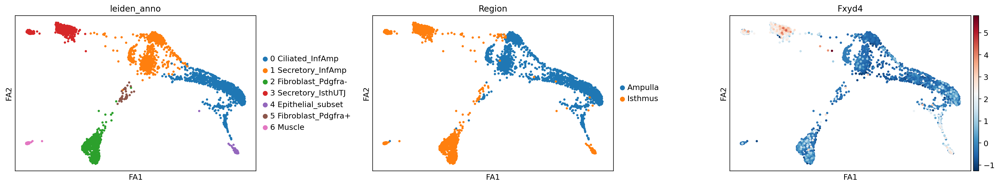

In [17]:
sc.pl.draw_graph(E24AmIs_subset_batchcorrected_analyzed_velo, wspace=0.35,
                 color=['leiden_anno', 'Region', 'Fxyd4'])

In [18]:
E24AmIs_subset_batchcorrected_analyzed_velo

AnnData object with n_obs × n_vars = 2916 × 8087
    obs: 'Clusters', '_X', '_Y', 'Region', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'Region_colors', "dendrogram_['leiden']", 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'leiden_anno_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'draw_graph'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa', 'velocity_draw_graph_fa'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'connectivities', 'distances'

Compute differential velocity genes, 'resolution' is set to the same from the Seurat pipeline. 'n_genes' is set high to receive as much as possible of differential velocity genes

In [19]:
scv.tl.rank_velocity_genes(E24AmIs_subset_batchcorrected_analyzed_velo, resolution=0.1, n_genes=5000, 
                           groupby='leiden_anno', match_with='leiden_anno')

ranking velocity genes
    finished (0:00:05) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [20]:
pd.DataFrame(E24AmIs_subset_batchcorrected_analyzed_velo.uns['rank_velocity_genes']['names']).head(5000)

,0 Ciliated_InfAmp,1 Secretory_InfAmp,2 Fibroblast_Pdgfra-,3 Secretory_IsthUTJ,4 Epithelial_subset,5 Fibroblast_Pdgfra+,6 Muscle
0,Rp1,Kif13a,Zfpm2,Mamld1,Plcb1,Arhgap6,Fry
1,Wdr95,Slco3a1,Cacna1a,Mab21l3,Mapk10,Pcdh7,Msrb3
2,Ccdc30,Atp13a5,Mast4,Atrnl1,Myocd,Ampd3,Prkg2
3,Palm2,Rnf217,Adamtsl1,Dach1,Ntf3,Col5a2,Dmd
4,Grik4,Trabd2b,Csgalnact1,Pde7a,Pir,Rbms3,Rasal2
...,...,...,...,...,...,...,...
1064,Pde3a,Tgfbr3,Togaram2,Ttc28,Vill,Slc39a8,Ptges3
1065,Cpeb1,Ankrd44,Runx1,Ankrd44,Pltp,Nr2f2,Gadd45b
1066,Tcf7l2,Arhgap18,Stox2,Ccdc88a,Slc2a3,Lifr,Amotl1
1067,Pdgfd,Ghr,Plcb4,Asic2,Plekhs1,Ccdc80,Jag1


In [21]:
E24AmIs_subset_batchcorrected_analyzed_velo_Drivers = pd.DataFrame(E24AmIs_subset_batchcorrected_analyzed_velo.uns['rank_velocity_genes']['names'])

In [22]:
E24AmIs_subset_batchcorrected_analyzed_velo_Drivers.to_csv('./E24AmIs_subset_batchcorrected_analyzed_velo_Drivers.csv')

In [23]:
E24AmIs_subset_batchcorrected_analyzed_velo_Drivers_variables = E24AmIs_subset_batchcorrected_analyzed_velo.var.copy()

In [24]:
E24AmIs_subset_batchcorrected_analyzed_velo_Drivers_variables.to_csv('./E24AmIs_subset_batchcorrected_analyzed_velo_Drivers_variables.csv')

saving figure to file ./figures/scvelo__velocitygraphFAE24AmIs_subset_batchcorrected_analyzed_velo.pdf


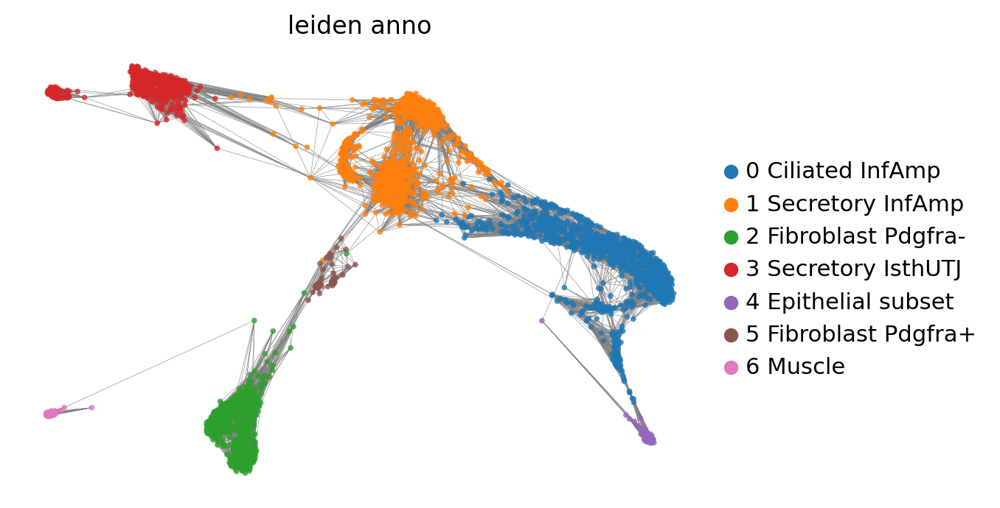

In [25]:
scv.pl.velocity_graph(E24AmIs_subset_batchcorrected_analyzed_velo, basis='X_draw_graph_fa',
                     color='leiden_anno', legend_loc='right margin',
                     save='_velocitygraphFAE24AmIs_subset_batchcorrected_analyzed_velo.pdf')

In [26]:
E24AmIs_subset_batchcorrected_analyzed_velo.write('./E24AmIs_subset_batchcorrected_analyzed_velo.h5ad')

In [27]:
E24AmIs_subset_batchcorrected_analyzed_velo

AnnData object with n_obs × n_vars = 2916 × 8087
    obs: 'Clusters', '_X', '_Y', 'Region', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: 'Region_colors', "dendrogram_['leiden']", 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'leiden_anno_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'draw_graph', 'rank_velocity_genes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa', 'velocity_draw_graph_fa'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'connectivities', 'distances'

In [28]:
%time E24AmIs_subset_batchcorrected_analyzed_velo_dynamics = scv.tl.recover_dynamics(E24AmIs_subset_batchcorrected_analyzed_velo, copy=True)

recovering dynamics
    finished (0:10:49) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
CPU times: user 10min 49s, sys: 512 ms, total: 10min 49s
Wall time: 10min 49s


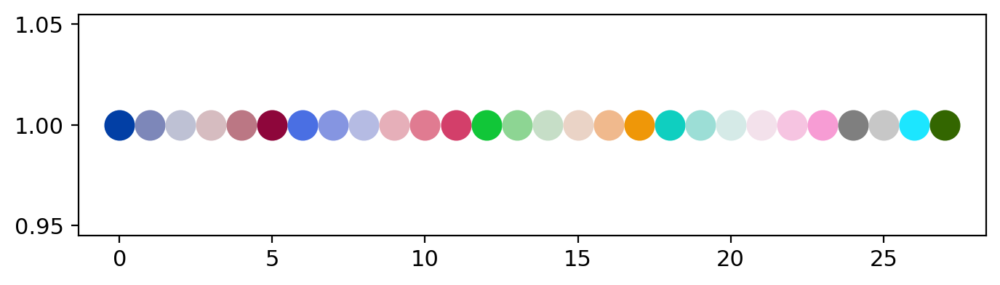

In [29]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [30]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics.uns['leiden_anno_colors'])

In [31]:
new_colors[[0]] = zeileis_colors[[23]]  #0 Ciliated_InfAmp
new_colors[[1]] = zeileis_colors[[6]]  #1 Secretory_InfAmp
new_colors[[2]] = zeileis_colors[[17]]  #2 Fibroblast Pdgfra-
new_colors[[3]] = zeileis_colors[[13]]  #3 Secretory_IsthUTJ
new_colors[[4]] = zeileis_colors[[5]]  #4 Epithelial_subset
new_colors[[5]] = zeileis_colors[[16]]  #5 Fibroblast Pdgfra+ 
new_colors[[6]] = zeileis_colors[[24]]  #6 Muscle

In [32]:
E24AmIs_subset_batchcorrected_analyzed_velo_dynamics.uns['leiden_anno_colors'] = new_colors

In [33]:
scv.tl.velocity(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics, mode='dynamical')
scv.tl.velocity_graph(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics)

computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


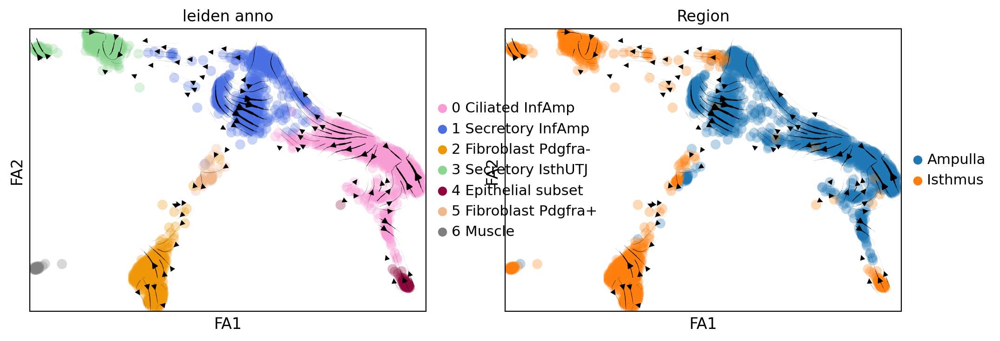

In [34]:
scv.pl.velocity_embedding_stream(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics, basis='X_draw_graph_fa',
                                 color=['leiden_anno', 'Region'],
                                 frameon=True, legend_loc='right margin')

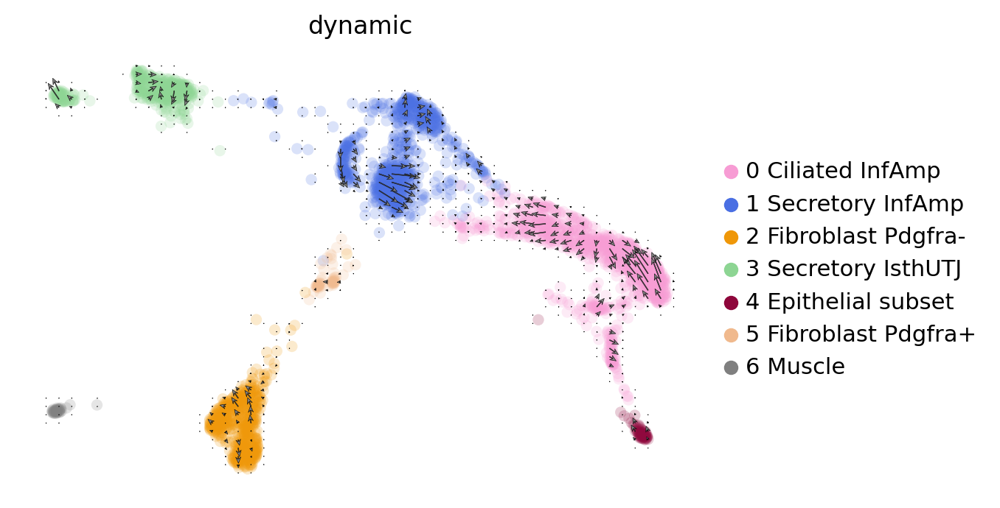

In [35]:
scv.pl.velocity_embedding_grid(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics, legend_loc='right margin', 
                               color='leiden_anno', basis='X_draw_graph_fa',
                               layer=['velocity'], arrow_size=1.5, title='dynamic')

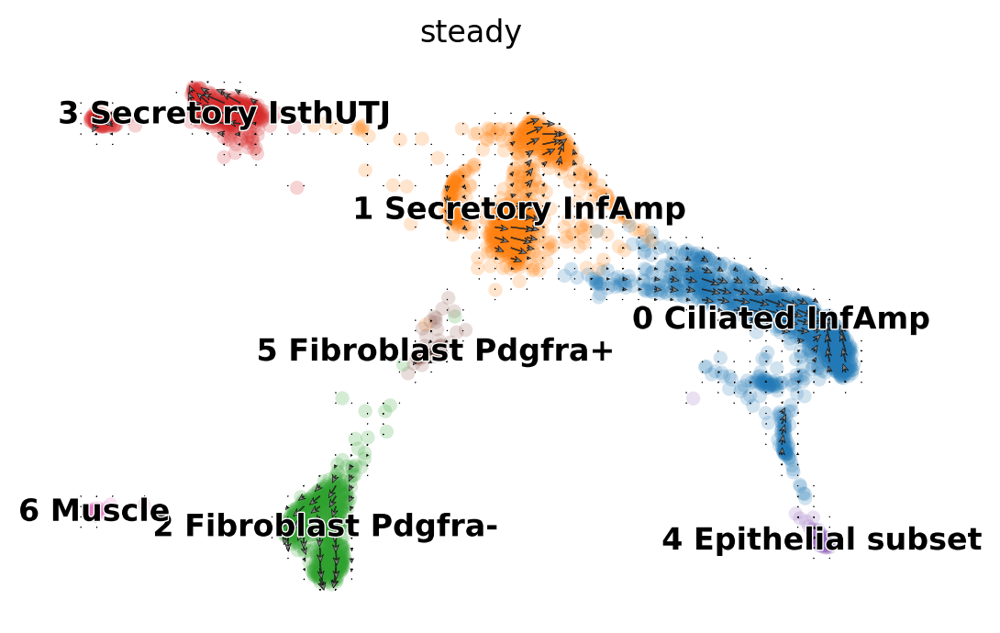

In [36]:
scv.pl.velocity_embedding_grid(E24AmIs_subset_batchcorrected_analyzed_velo, legend_loc='on data',
                               color='leiden_anno', basis='X_draw_graph_fa',
                               layer=['velocity'], arrow_size=1.5, title='steady')

In [37]:
E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_var = E24AmIs_subset_batchcorrected_analyzed_velo_dynamics.var.copy()

In [38]:
E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_var.to_csv('./E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_var.csv')

In [39]:
scv.tl.recover_latent_time(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics)

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


saving figure to file ./figures/scvelo__latenttime_FA_E24AmIs_subset_batchcorrected_analyzed_velo_dynamic.pdf


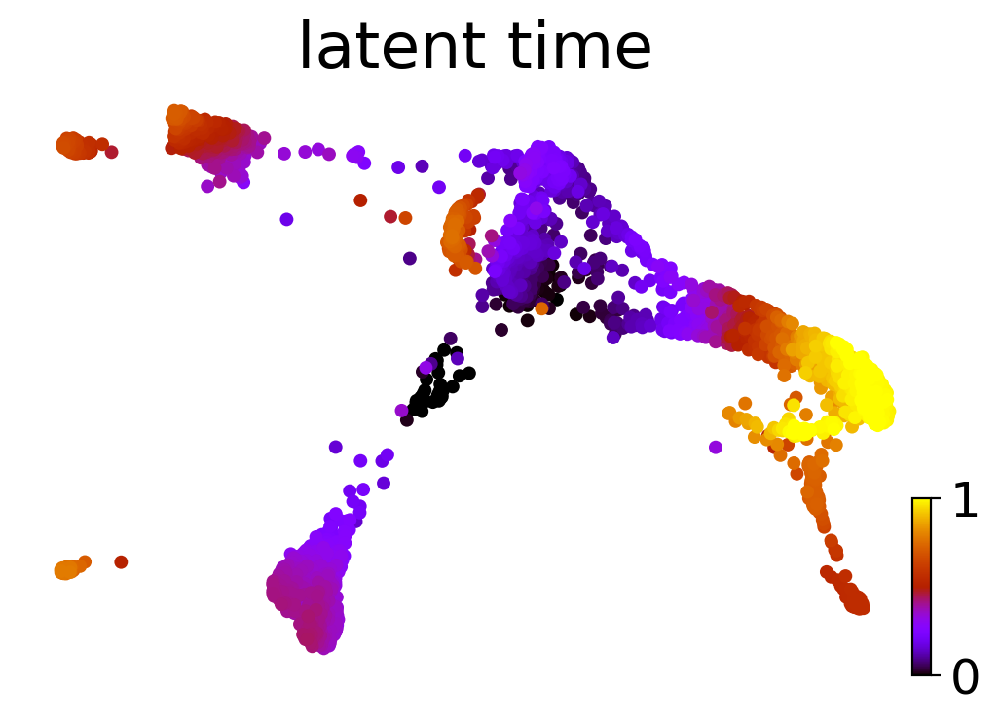

In [40]:
scv.pl.scatter(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics, color='latent_time', fontsize=24, size=100, basis='X_draw_graph_fa',
               color_map='gnuplot', perc=[2, 98], colorbar=True, rescale_color=[0,1],
              save='_latenttime_FA_E24AmIs_subset_batchcorrected_analyzed_velo_dynamic.pdf')

In [41]:
E24AmIs_subset_batchcorrected_analyzed_velo_dynamics

AnnData object with n_obs × n_vars = 2916 × 8087
    obs: 'Clusters', '_X', '_Y', 'Region', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'fit_r2'
    uns: 'Region_colors', "dendrogram_['leiden']", 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'leiden_anno_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'draw_graph', 'rank_velo

saving figure to file ./figures/scvelo__Fig 5C_E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_VelocityPlot_FA_Igf1.pdf


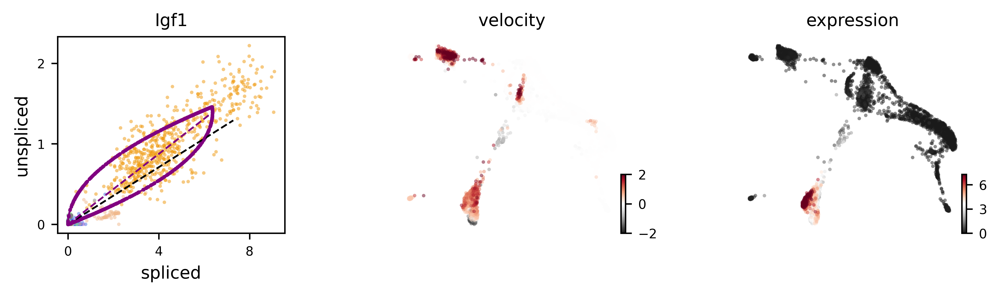

In [42]:
var_names0 = ['Igf1']
scv.pl.velocity(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics, 
                color='leiden_anno', basis='X_draw_graph_fa', dpi=300,
                var_names=var_names0, colorbar=True, color_map='RdGy_r',
               save='_Fig 5C_E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_VelocityPlot_FA_Igf1.pdf')

saving figure to file ./figures/scvelo__Fig 5_E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_VelocityPlot_FA_Fgf1.pdf


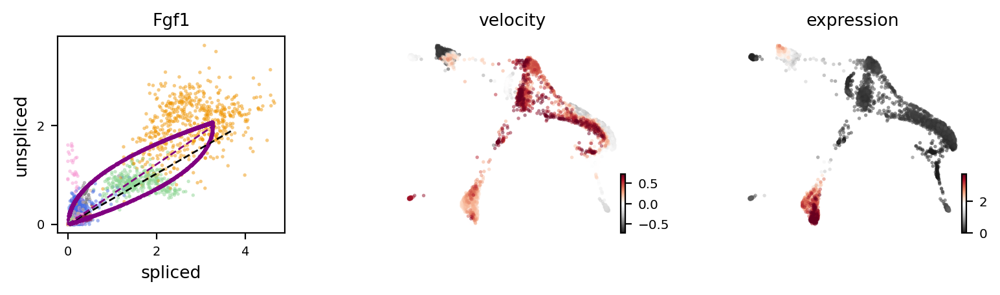

In [43]:
var_names0 = ['Fgf1']
scv.pl.velocity(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics, 
                color='leiden_anno', basis='X_draw_graph_fa', 
                var_names=var_names0, colorbar=True, color_map='RdGy_r',
               save='_Fig 5_E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_VelocityPlot_FA_Fgf1.pdf')

saving figure to file ./figures/scvelo__Fig 5_E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_VelocityPlot_FA_C3.pdf


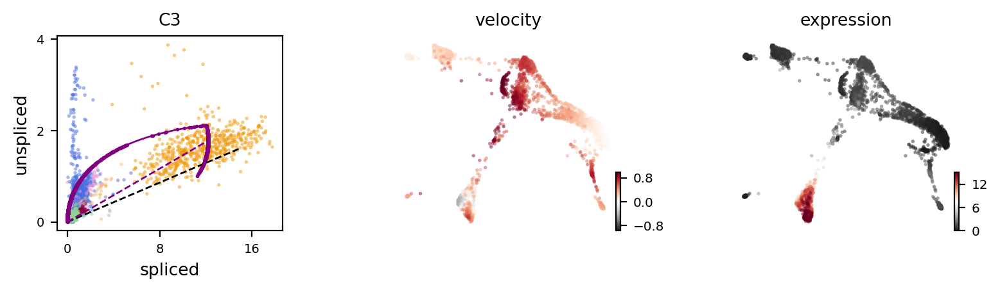

In [44]:
var_names0 = ['C3']
scv.pl.velocity(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics, 
                color='leiden_anno', basis='X_draw_graph_fa', 
                var_names=var_names0, colorbar=True, color_map='RdGy_r',
               save='_Fig 5_E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_VelocityPlot_FA_C3.pdf')

saving figure to file ./figures/scvelo__Fig 5C_E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_VelocityPlot_FA_Leiden.pdf


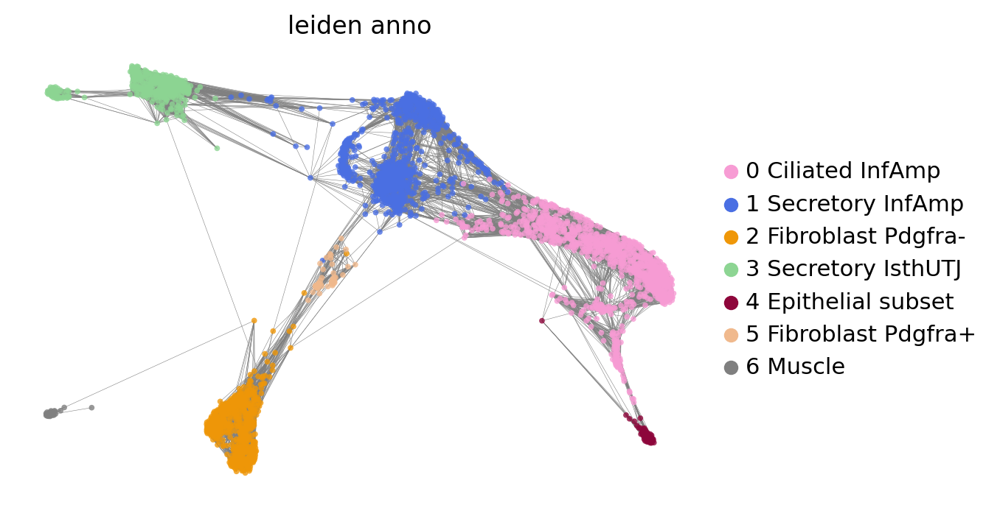

In [45]:
scv.pl.velocity_graph(E24AmIs_subset_batchcorrected_analyzed_velo_dynamics, basis='X_draw_graph_fa',
                                 color=['leiden_anno'],
                                 frameon=False, legend_loc='right margin',
                     save='_Fig 5C_E24AmIs_subset_batchcorrected_analyzed_velo_dynamics_VelocityPlot_FA_Leiden.pdf')

In [46]:
E24AmIs_subset_batchcorrected_analyzed_velo_dynamics.write('./E24AmIs_subset_batchcorrected_analyzed_velo_dynamics.h5ad')